# Highly-multiplexed image analysis with `Harpy` and `Kronos`.

This notebook reimplements parts of the code from the [KRONOS](https://github.com/mahmoodlab/KRONOS/tree/main/tutorials) repository to enable interoperability with [SpatialData](https://github.com/scverse/spatialdata). Feature extraction using the KRONOS model has been optimized with [Dask](https://github.com/dask/dask) for efficient scaling to gigapixel-scale images. We also refer to the KRONOS paper by [Shaban M. et al (2025)](https://arxiv.org/abs/2506.03373).

We will use an annotated `CODEX` datataset ([Shaban M. et al. (2023)](https://zenodo.org/records/10067010)).

To obtain a mapping between your data specific marker names and the marker names used by the KRONOS foundation model, we refer to [this](./map_to_kronos_markers.ipynb) notebook.


To run this notebook, make sure to install [`harpy`](https://github.com/saeyslab/harpy) and [`kronos`](https://github.com/mahmoodlab/KRONOS).

```bash
uv venv .venv_harpy_kronos --python=3.12
source .venv_harpy_kronos/bin/activate
uv pip install "git+https://github.com/saeyslab/harpy.git@main"
uv pip install "git+https://github.com/mahmoodlab/KRONOS.git#egg=kronos[tutorials]"
```

In [ ]:
import os

import harpy as hp

# This will download approximately 24GB. By setting the environment varialble 'HARPY_POOCH_CACHE' in a .env file, one can specify where this data will be cached.
sdata = hp.datasets.codex_example()

path = os.environ.get("SCRATCHDIR")  # choose an output directory of choice.
sdata.write(os.path.join(path, "sdata_codex.zarr"))

# Fetch the csv file containing the mapping between the data specific marker names and the marker names used by the Kronos model.
registry = hp.datasets.get_registry()
matched_channels_path = registry.fetch("proteomics/codex/chl_maps_dataset/marker_metadata_mapped.csv")

/data/groups/technologies/spatial.catalyst/Arne/harpy/.venv_harpy_kronos/lib/python3.12/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


Before running the `Harpy` function `hp.tb.featurize`, please make sure the image and the segmentation mask, have the same spatial chunksize on disk.

Using a smaller chunksize in `c`, `y` and `x` will reduce RAM usage.

If not, you could rechunk as follows:

```Python
sdata = hp.im.add_image( 
    sdata,
    arr=sdata["image"][ "scale0" ]["image"].data.rechunk( ( 10,2048,2048 ) ),
    output_image_name = "image",
    scale_factors=[2,2,2,2],
    c_coords = sdata["image"][ "scale0" ]["image"].c.data,
    overwrite=True,
 )

 sdata = hp.im.add_labels( 
    sdata,
    arr=sdata["segmentation_mask"][ "scale0" ]["image"].data.rechunk( ( 2048,2048 ) ),
    output_labels_name = "segmentation_mask",
    scale_factors=[2,2,2,2],
    overwrite=True,
 )
 ```

In [2]:
display(sdata["image"]["scale0"]["image"])
display(sdata["segmentation_mask"]["scale0"]["image"])

<xarray.DataArray 'image' (c: 49, y: 8011, x: 8085)> Size: 6GB
dask.array<from-zarr, shape=(49, 8011, 8085), dtype=uint16, chunksize=(10, 2048, 2048), chunktype=numpy.ndarray>
Coordinates:
  * c        (c) <U11 2kB 'BCL-2' 'CCR6' 'CD11B' ... 'A-SMA' 'B-CATENIN'
  * y        (y) float64 64kB 0.5 1.5 2.5 3.5 ... 8.008e+03 8.01e+03 8.01e+03
  * x        (x) float64 65kB 0.5 1.5 2.5 3.5 ... 8.082e+03 8.084e+03 8.084e+03
Attributes:
    transform:  {'global': Identity }

<xarray.DataArray 'image' (y: 8011, x: 8085)> Size: 259MB
dask.array<from-zarr, shape=(8011, 8085), dtype=int32, chunksize=(2048, 2048), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 64kB 0.5 1.5 2.5 3.5 ... 8.008e+03 8.01e+03 8.01e+03
  * x        (x) float64 65kB 0.5 1.5 2.5 3.5 ... 8.082e+03 8.084e+03 8.084e+03
Attributes:
    transform:  {'global': Identity }

The `AnnData` table `"table_intensities"`in the `SpatialData` object `sdata` contains the main intensity (in `sdata["table_intensities"].X`) for each instance in the segmentation mask `segmentation_mask`. These mean intensities were calculated as follows:

```python
hp.tb.allocate_intensity(
  sdata,
  image_name="image",
  labels_name="segmentation_mask",
  output_table_name=table_name,
  mode="mean",
  calculate_center_of_mass=True,
  overwrite=True,
  )
```

In [4]:
sdata["table_intensities"].to_df().head()

channels,BCL-2,CCR6,CD11B,CD11C,CD15,CD16,CD162,CD163,CD2,CD20,...,PD-L1,PODOPLANIN,T-BET,TCR-G-D,TCRB,TIM-3,VISA,VIMENTIN,A-SMA,B-CATENIN
cells,,,,,,,,,,,,,,,,,,,,,
1_segmentation_mask_3314222a,34272.214844,1579.261963,1.000000,1.000000,1.000000,1088.190430,37.214287,113.309525,7561.904785,51194.882812,...,630.404785,591.785706,1664.023804,5099.714355,531.071411,60.666668,1.000000,2658.666748,4.547619,58.119049
2_segmentation_mask_3314222a,0.000000,325.746033,2291.952393,14611.238281,1304.349243,41.190475,823.365051,151.888885,33.047619,0.412698,...,1127.000000,1.000000,118.333336,1740.126953,194.634918,1025.888916,402.714294,16652.603516,2.539683,268.000000
3_segmentation_mask_3314222a,2622.344727,344.517242,2660.862061,2214.655273,3181.965576,1082.896606,1.000000,113.724136,88.724136,1043.000000,...,1177.758667,1.000000,273.344818,1515.206909,0.000000,45.965519,1001.137939,1358.206909,6.000000,105.206894
4_segmentation_mask_3314222a,0.250000,32.906250,2395.468750,4671.671875,0.453125,705.953125,80.031250,3040.734375,1629.125000,1.000000,...,364.453125,31.156250,30.375000,0.000000,174.687500,1361.390625,503.000000,1070.484375,182.000000,283.906250
5_segmentation_mask_3314222a,8693.557617,282.901642,1.000000,210.622955,1.000000,41.606556,3547.672119,168.672134,6995.393555,2731.491699,...,186.098358,60.786884,882.737732,1170.868896,1991.655762,122.836067,0.983607,4394.360840,30.295082,0.000000


In [5]:
import pandas as pd

matched_channels = pd.read_csv(matched_channels_path)
matched_channels.head()

,marker_name,marker_name_pretrained,marker_id_pretrained,marker_mean,marker_std,marker_id
0,BCL-2,BCL2,150,0.047104,0.060276,0
1,CCR6,CCR6,166,0.044867,0.042833,1
2,CD11B,CD11B,180,0.032169,0.052366,2
3,CD11C,CD11C,182,0.019039,0.044336,3
4,CD15,CD15,194,0.016322,0.040416,4


In [7]:
from dask.distributed import Client, LocalCluster

cluster = LocalCluster(
    n_workers=4,
    threads_per_worker=1,
    memory_limit="32GB",
    local_directory=os.environ.get("SCRATCHDIR"),  # directory where dask will spill to disk
)

client = Client(cluster)
print(client.dashboard_link)

http://127.0.0.1:8787/status


In [ ]:
import pandas as pd

import harpy as hp

# Hugging Face authentication token needs to be provided when downloading the model from the Hugging Face hub.
HF_AUTH_TOKEN = os.environ.get("HF_AUTH_TOKEN")

# you could choose to specify a local path as the checkpoint path for the kronos model. By default it will download the kronos model from the Hugging Face hub "hf_hub:MahmoodLab/kronos".
# checkpoint_path = "/data/groups/technologies/spatial.catalyst/Arne/kronos_example_data/models--MahmoodLab--kronos/snapshots/8edc2719ad67b2e2b766073b35c6cf8e6f5da516/kronos_vits16_model.pt"

# you could choose to set markers_to_keep = None, then all markers will be used.
markers_to_keep = [
    "DAPI-01",
    "CD11B",
    "CD11C",
    "CD15",
    "CD163",
    "CD20",
    "CD206",
    "CD30",
    "CD31",
    "CD4",
    "CD56",
    "CD68",
    "CD7",
    "CD8",
    "CYTOKERITIN",
    "FOXP3",
    "MCT",
    "PODOPLANIN",
]
matched_channels = matched_channels[matched_channels["marker_name"].isin(markers_to_keep)]

# keyword arguments passed to hp.utils.kronos_embedding
model_kwargs = {
    "hf_auth_token": HF_AUTH_TOKEN,
    "matched_channels": matched_channels,
    "max_value": 65535.0,
    "do_instance_embedding": False,
}

table_name = "table_intensities"

sdata = hp.tb.featurize(
    sdata,
    image_name="image",
    labels_name="segmentation_mask",
    table_name=table_name,
    output_table_name=table_name,
    depth=200,
    diameter=16 * 4,  # kronos patch sizes must be multiples of 16
    embedding_dimension=384
    * matched_channels.shape[0],  # all channels are matched, so it is embedding_dim*num_channels
    model=hp.utils.kronos_embedding,
    model_kwargs=model_kwargs,
    batch_size=250,
    overwrite=True,
)
client.close()

In [9]:
sdata["table_intensities"].obsm["embedding"].shape  # -> kronos embedding

(152815, 6912)

In [10]:
from sklearn.cluster import KMeans

kmeans = KMeans(
    n_clusters=20,
    random_state=0,
)

labels = kmeans.fit_predict(sdata[table_name].obsm["embedding"])

sdata[table_name].obs["kronos"] = labels
sdata[table_name].obs["kronos"] = sdata[table_name].obs["kronos"].astype("category")

# back cluster ids to zarr
sdata = hp.tb.add_table(
    sdata,
    adata=sdata[table_name],
    output_table_name=table_name,
    region=["segmentation_mask"],
    overwrite=True,
)

2025-11-10 14:37:20,500 - harpy.utils._io - WARNING - layer with name 'table_intensities' already exists. Overwriting...


In [7]:
# normalize before calculating leiden clusters
sdata = hp.tb.preprocess_proteomics(
    sdata,
    labels_name="segmentation_mask",
    table_name=table_name,
    output_table_name=f"{table_name}_normalized",
    size_norm=False,
    log1p=False,
    q=0.99,
    max_value_q=1,
    overwrite=True,
)

2025-11-10 15:37:49,430 - harpy.table._preprocess - INFO - Calculating cell size from provided labels_layer 'segmentation_mask'
/home/VIB.LOCAL/arne.defauw/.local/share/uv/python/cpython-3.12.10-linux-x86_64-gnu/lib/python3.12/functools.py:912: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
2025-11-10 15:37:50,845 - harpy.table._preprocess - INFO - Saving non preprocessed data matrix to '.layers[raw_counts]'.
/data/groups/technologies/spatial.catalyst/Arne/harpy/.venv_harpy_kronos/lib/python3.12/site-packages/spatialdata/models/models.py:1183: UserWarning: Converting `region_key: fov_labels` to categorical dtype.
  convert_region_column_to_categorical(adata)
2025-11-10 15:38:14,859 - harpy.utils._io - WARNING - layer with name 'table_intensities_normalized' already exists. Overwriting...


In [8]:
sdata[f"{table_name}_normalized"].to_df().head()

channels,BCL-2,CCR6,CD11B,CD11C,CD15,CD16,CD162,CD163,CD2,CD20,...,PD-L1,PODOPLANIN,T-BET,TCR-G-D,TCRB,TIM-3,VISA,VIMENTIN,A-SMA,B-CATENIN
cells,,,,,,,,,,,,,,,,,,,,,
1_segmentation_mask_3314222a,79.668221,62.177567,0.011111,0.004568,0.003408,14.284677,0.796612,1.115642,36.489056,100.000000,...,8.457295,11.425946,24.895376,68.573784,16.188705,0.666807,0.045563,13.841380,4.506205,5.740132
2_segmentation_mask_3314222a,0.000000,12.825038,25.464931,66.745941,4.445347,0.540707,17.625029,1.495494,0.159467,0.000900,...,15.119448,0.019308,1.770379,23.398777,5.933077,11.275876,18.348717,86.695709,2.516554,26.469042
3_segmentation_mask_3314222a,6.095829,13.564084,29.563736,10.116818,10.844443,14.215184,0.021406,1.119725,0.428128,2.274806,...,15.800408,0.019308,4.089499,20.374371,0.000000,0.505222,45.614468,7.071009,5.945360,10.390767
4_segmentation_mask_3314222a,0.000581,1.295561,26.615061,21.340773,0.001544,9.267047,1.713156,29.938982,7.861145,0.002181,...,4.889379,0.601552,0.454439,0.000000,5.325017,14.963484,22.917997,5.573087,100.000000,28.040024
5_segmentation_mask_3314222a,20.208799,11.138199,0.011111,0.962152,0.003408,0.546169,75.941795,1.660741,33.755424,5.957442,...,2.496632,1.173647,13.206595,15.744198,60.711853,1.350131,0.044816,22.877638,30.019194,0.000000


In [9]:
# takes approx 20 minutes

# We do leiden clustering with these channels filtered out: [ "EGFR", "FOXP3", "PD-L1", "T-BET", "TCR-G-D", "CD56", "CD69" ], because there are tiling effects in them.

subset_channels = [
    _channel
    for _channel in sdata[f"{table_name}_normalized"].var_names
    if _channel not in ["EGFR", "FOXP3", "PD-L1", "T-BET", "TCR-G-D", "CD56", "CD69"]
]

sdata = hp.tb.leiden(
    sdata,
    labels_name="segmentation_mask",
    table_name=f"{table_name}_normalized",
    output_table_name=f"{table_name}_normalized_leiden",  # write to new slot, because we subset the channels
    index_names_var=subset_channels,
    key_added="leiden",
    overwrite=True,
)

/data/groups/technologies/spatial.catalyst/Arne/harpy/.venv_harpy_kronos/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:479: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/data/groups/technologies/spatial.catalyst/Arne/harpy/.venv_harpy_kronos/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:480: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/data/groups/technologies/spatial.catalyst/Arne/harpy/.venv_harpy_kronos/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:479: RuntimeWarning: invalid value encountered in divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/data/groups/technologies/spatial.catalyst/Arne/harpy/.venv_harpy_kronos/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/data/groups/technologies/spatial

In [10]:
sdata[f"{table_name}_normalized"].to_df().head()

channels,BCL-2,CCR6,CD11B,CD11C,CD15,CD16,CD162,CD163,CD2,CD20,...,PD-L1,PODOPLANIN,T-BET,TCR-G-D,TCRB,TIM-3,VISA,VIMENTIN,A-SMA,B-CATENIN
cells,,,,,,,,,,,,,,,,,,,,,
1_segmentation_mask_3314222a,79.668221,62.177567,0.011111,0.004568,0.003408,14.284677,0.796612,1.115642,36.489056,100.000000,...,8.457295,11.425946,24.895376,68.573784,16.188705,0.666807,0.045563,13.841380,4.506205,5.740132
2_segmentation_mask_3314222a,0.000000,12.825038,25.464931,66.745941,4.445347,0.540707,17.625029,1.495494,0.159467,0.000900,...,15.119448,0.019308,1.770379,23.398777,5.933077,11.275876,18.348717,86.695709,2.516554,26.469042
3_segmentation_mask_3314222a,6.095829,13.564084,29.563736,10.116818,10.844443,14.215184,0.021406,1.119725,0.428128,2.274806,...,15.800408,0.019308,4.089499,20.374371,0.000000,0.505222,45.614468,7.071009,5.945360,10.390767
4_segmentation_mask_3314222a,0.000581,1.295561,26.615061,21.340773,0.001544,9.267047,1.713156,29.938982,7.861145,0.002181,...,4.889379,0.601552,0.454439,0.000000,5.325017,14.963484,22.917997,5.573087,100.000000,28.040024
5_segmentation_mask_3314222a,20.208799,11.138199,0.011111,0.962152,0.003408,0.546169,75.941795,1.660741,33.755424,5.957442,...,2.496632,1.173647,13.206595,15.744198,60.711853,1.350131,0.044816,22.877638,30.019194,0.000000


In [11]:
table_name

'table_intensities'

Add the calculated leiden cluster ids to the table element where we did not subset the channels. This allows us to calculate mean intensity on all channels layer on.

In [12]:
import pandas as pd

from spatialdata.models import TableModel

instance_key = sdata[table_name].uns[TableModel.ATTRS_KEY][TableModel.INSTANCE_KEY]
region_key = sdata[table_name].uns[TableModel.ATTRS_KEY][TableModel.REGION_KEY_KEY]

index = sdata[f"{table_name}_normalized"].obs.index
name = sdata[f"{table_name}_normalized"].obs.index.name

if "leiden" in sdata[f"{table_name}_normalized"].obs.columns:
    sdata[f"{table_name}_normalized"].obs.drop(columns=["leiden"], inplace=True)

sdata[f"{table_name}_normalized"].obs = pd.merge(
    sdata[f"{table_name}_normalized"].obs,
    sdata[f"{table_name}_normalized_leiden"].obs[["leiden", region_key, instance_key]],
    on=[instance_key, region_key],
    how="inner",
)
sdata[f"{table_name}_normalized"].obs.index = index
sdata[f"{table_name}_normalized"].obs.index.name = name

# back to zarr store
sdata = hp.tb.add_table(
    sdata,
    adata=sdata[f"{table_name}_normalized"],
    output_table_name=f"{table_name}_normalized",
    region=["segmentation_mask"],
    overwrite=True,
)

/home/VIB.LOCAL/arne.defauw/.local/share/uv/python/cpython-3.12.10-linux-x86_64-gnu/lib/python3.12/functools.py:912: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
2025-11-10 15:53:54,902 - harpy.utils._io - WARNING - layer with name 'table_intensities_normalized' already exists. Overwriting...


2025-11-10 15:54:28,017 - harpy.table._cluster_intensity - INFO - Weighted (by instance size) average intensity per cluster (cluster key: 'kronos') will be stored in 'sdata[table_intensities_normalized].uns[kronos_weighted_intensity]'.
2025-11-10 15:55:29,547 - harpy.utils._io - WARNING - layer with name 'table_intensities_normalized' already exists. Overwriting...
2025-11-10 15:57:11,057 - harpy.table._cluster_intensity - INFO - Weighted (by instance size) average intensity per cluster (cluster key: 'leiden') will be stored in 'sdata[table_intensities_normalized].uns[leiden_weighted_intensity]'.
2025-11-10 15:57:55,973 - harpy.utils._io - WARNING - layer with name 'table_intensities_normalized' already exists. Overwriting...


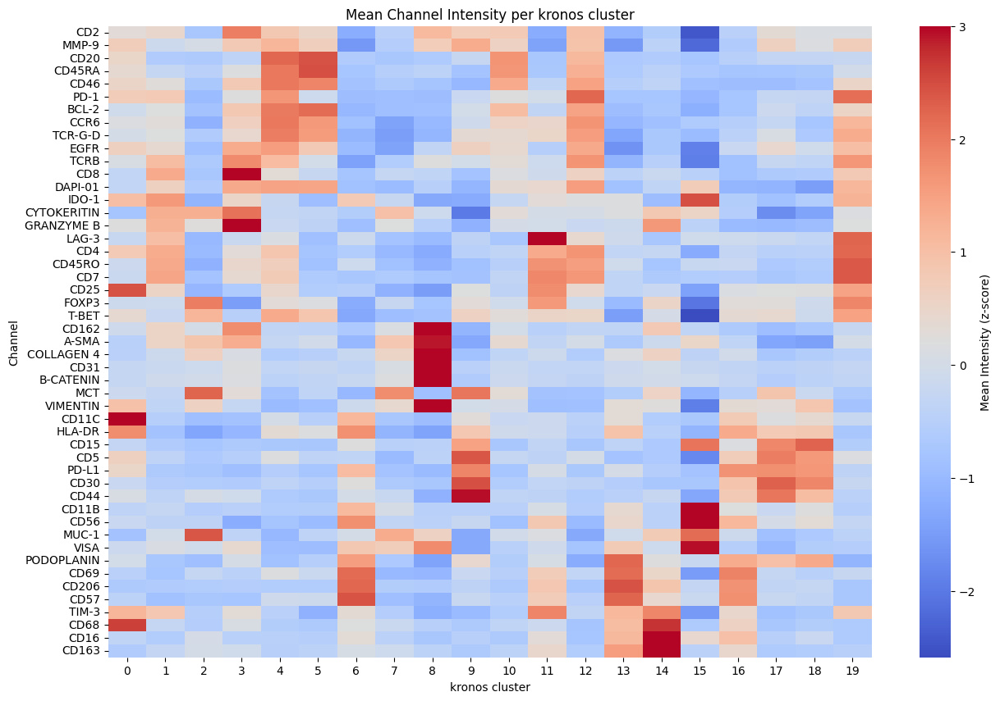

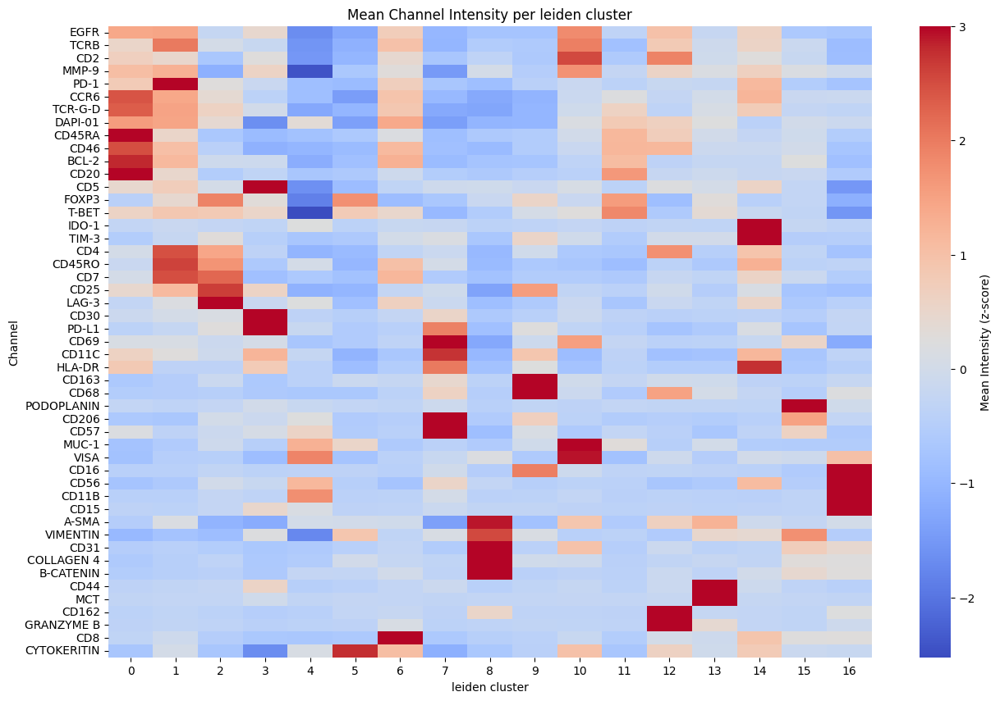

In [13]:
for _cluster in ["kronos", "leiden"]:
    sdata = hp.tb.cluster_intensity(
        sdata,
        table_name=f"{table_name}_normalized",
        labels_name="segmentation_mask",
        output_table_name=f"{table_name}_normalized",
        cluster_key=_cluster,
        layer_mean_intensities="raw_counts",  # layer in adata.layers that holds the mean intensities
        overwrite=True,
    )
    hp.pl.cluster_intensity_heatmap(
        sdata,
        table_name=f"{table_name}_normalized",
        cluster_key=_cluster,
        figsize=(15, 10),
    )

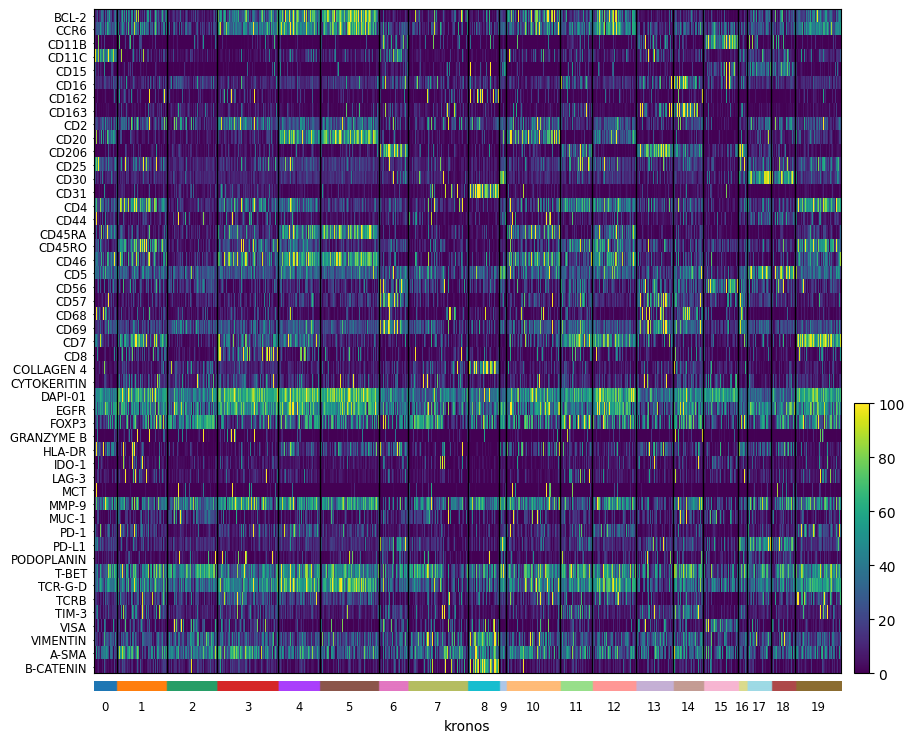

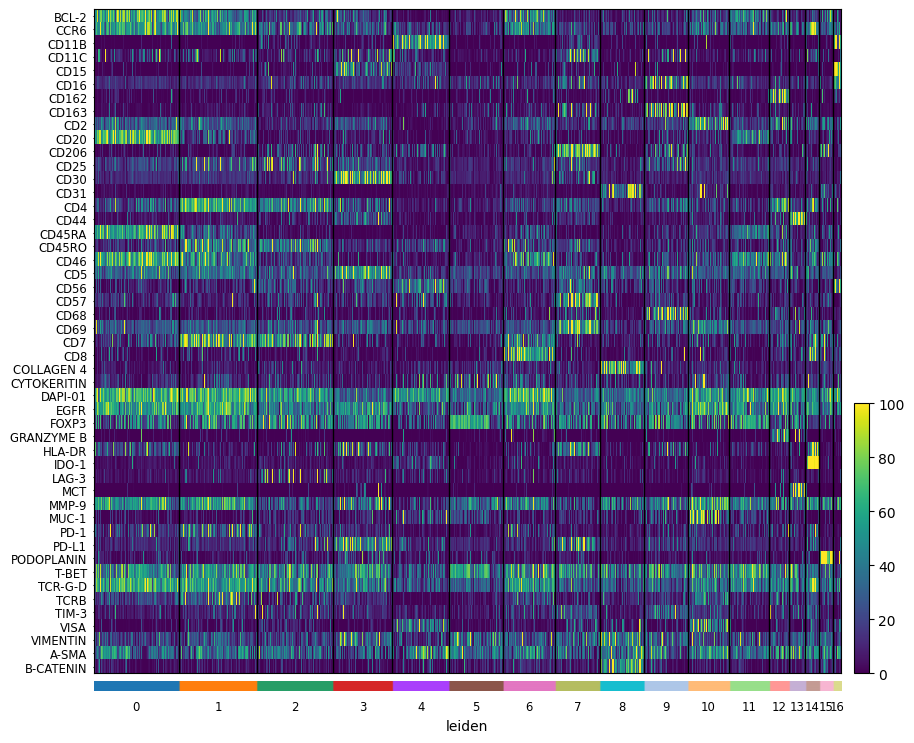

In [14]:
import scanpy as sc
from matplotlib.colors import Normalize

norm = Normalize(vmax=100, clip=False)
sc.pl.heatmap(
    sdata[f"{table_name}_normalized"],
    var_names=sdata[f"{table_name}_normalized"].var_names,
    groupby="kronos",
    swap_axes=True,
    norm=norm,
    use_raw=False,
)

sc.pl.heatmap(
    sdata[f"{table_name}_normalized"],
    var_names=sdata[f"{table_name}_normalized"].var_names,
    groupby="leiden",
    swap_axes=True,
    norm=norm,
    use_raw=False,
)

In [18]:
sdata[f"{table_name}_normalized"].obsm["X_umap"] = sdata[f"{table_name}_normalized_leiden"].obsm["X_umap"]

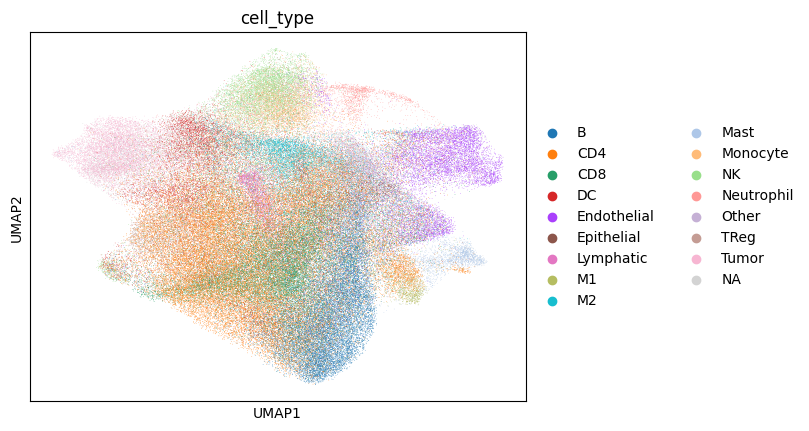

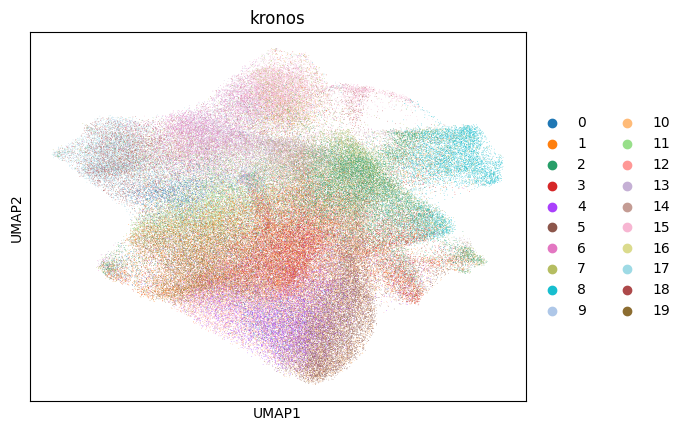

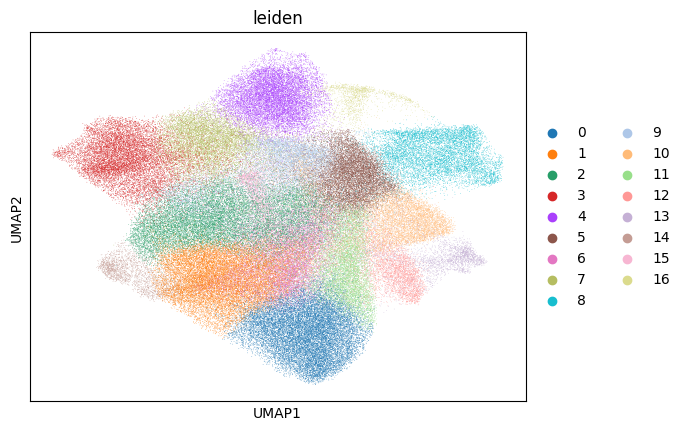

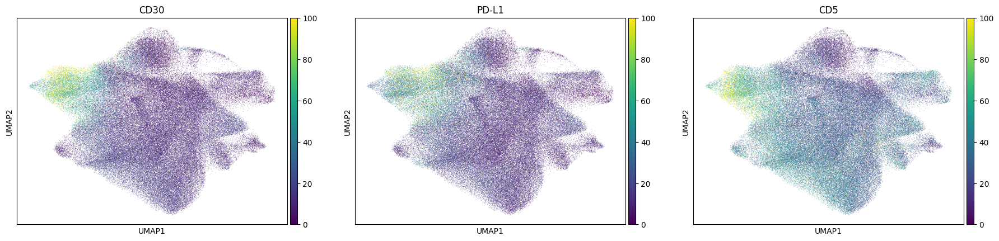

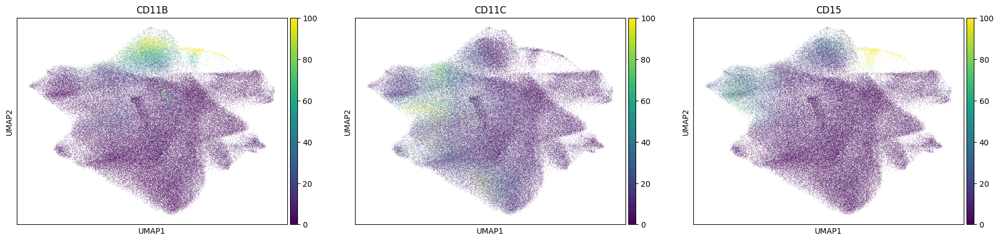

In [23]:
import scanpy as sc
from matplotlib.colors import Normalize

sc.pl.umap(sdata[f"{table_name}_normalized"], color=["cell_type"])

for _cluster_key in ["kronos", "leiden"]:
    sc.pl.umap(sdata[f"{table_name}_normalized"], color=[_cluster_key])

norm = Normalize(vmax=100, clip=False)
sc.pl.umap(
    sdata[f"{table_name}_normalized"], color=["CD30", "PD-L1", "CD5"], norm=norm, use_raw=False
)  # tumor markers

sc.pl.umap(sdata[f"{table_name}_normalized"], color=["CD11B", "CD11C", "CD15"], norm=norm, use_raw=False)

# note that these umaps are biased towards the leiden clusters (clusters will look more spatially seperated), because umaps are calculated on the same knn graph as the leiden clusters.

Next we try to estimate the measure of association between the KRONOS/Leiden clusters and the annotated cell type, by calculating the Cramers V statistic.

Cramers v: 0.40833263281018034
Chi-squared statistic: 359473.4853451965
p-value: 0.0


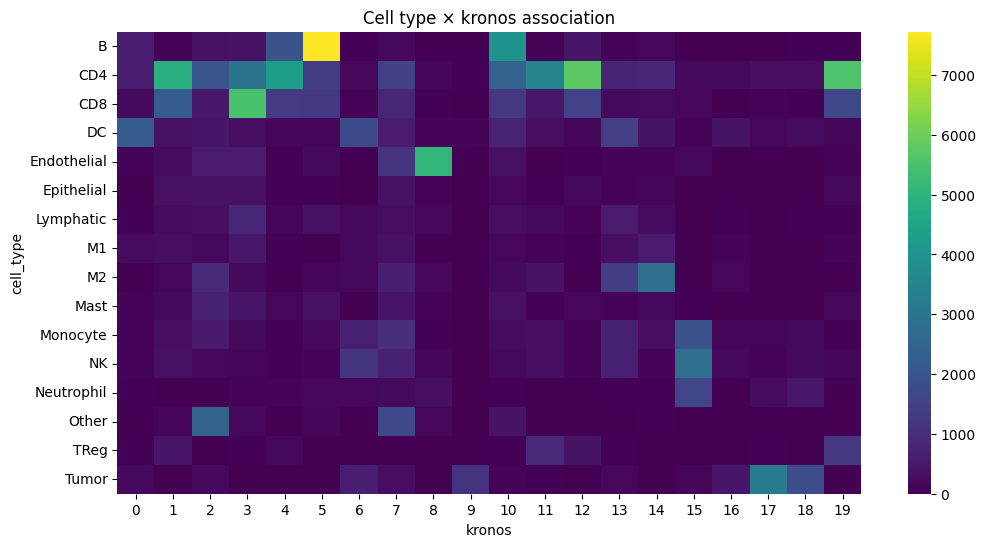

       cell_type kronos  std_residual   abs_resid
88   Endothelial      8    239.920615  239.920615
317        Tumor     17    190.376840  190.376840
5              B      5    173.119357  173.119357
174           M2     14    143.902390  143.902390
235           NK     15    125.539999  125.539999
309        Tumor      9    122.268829  122.268829
318        Tumor     18    114.545215  114.545215
262        Other      2    112.218924  112.218924
60            DC      0    110.584902  110.584902
255   Neutrophil     15    108.023549  108.023549
43           CD8      3    101.712499  101.712499
215     Monocyte     15     87.373576   87.373576
10             B     10     80.813422   80.813422
32           CD4     12     72.044409   72.044409
66            DC      6     72.007998   72.007998
267        Other      7     68.878832   68.878832
299         TReg     19     67.417829   67.417829
39           CD4     19     64.061963   64.061963
173           M2     13     57.987977   57.987977


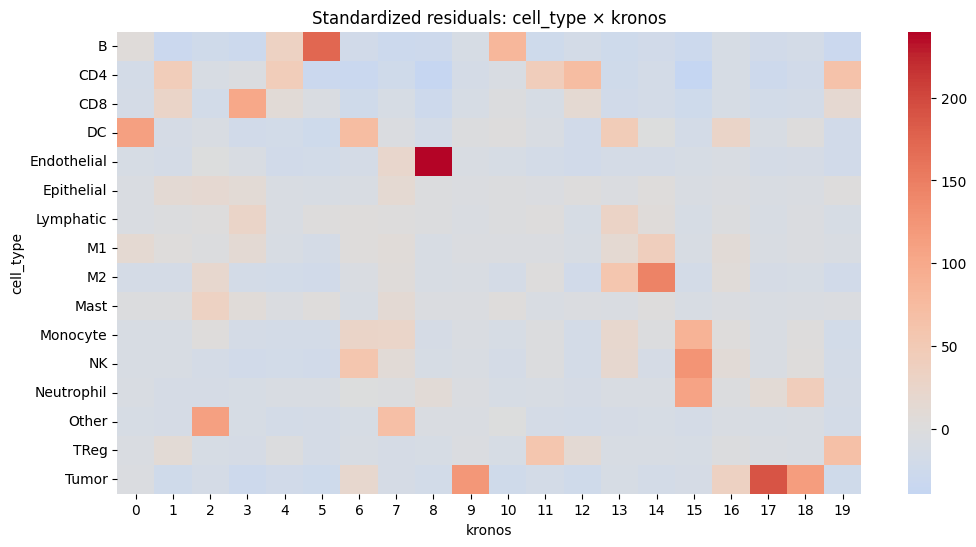

Cramers v: 0.573074536541328
Chi-squared statistic: 708045.0783542951
p-value: 0.0


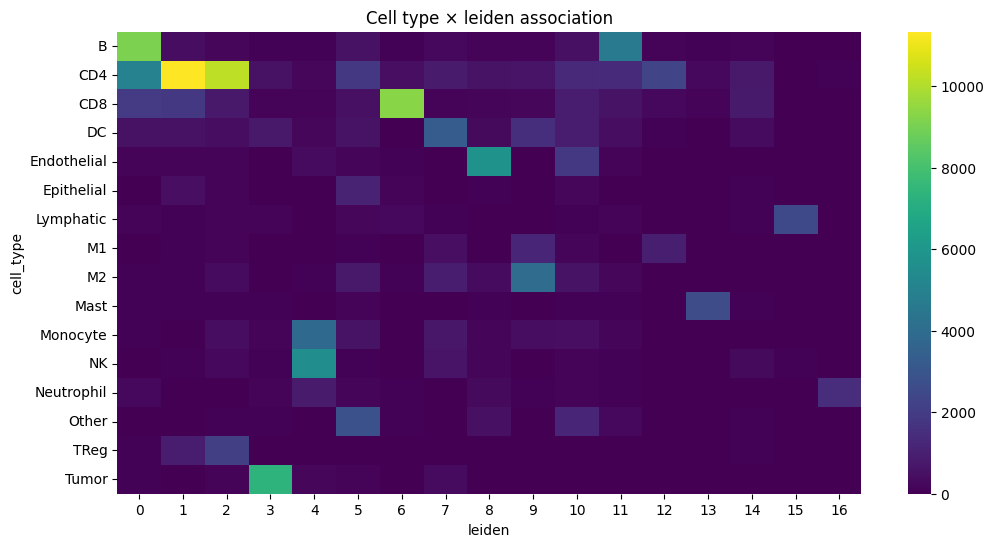

       cell_type leiden  std_residual   abs_resid
258        Tumor      3    292.654256  292.654256
117    Lymphatic     15    291.562718  291.562718
166         Mast     13    289.693060  289.693060
76   Endothelial      8    231.233794  231.233794
220   Neutrophil     16    228.920163  228.920163
40           CD8      6    222.583909  222.583909
191           NK      4    203.898082  203.898082
145           M2      9    175.362353  175.362353
0              B      0    160.610434  160.610434
174     Monocyte      4    139.437011  139.437011
226        Other      5    134.999515  134.999515
11             B     11    124.371550  124.371550
58            DC      7    122.938085  122.938085
18           CD4      1    112.172448  112.172448
19           CD4      2     98.468486   98.468486
131           M1     12     94.287696   94.287696
240         TReg      2     93.462668   93.462668
90    Epithelial      5     77.534145   77.534145
128           M1      9     74.155199   74.155199


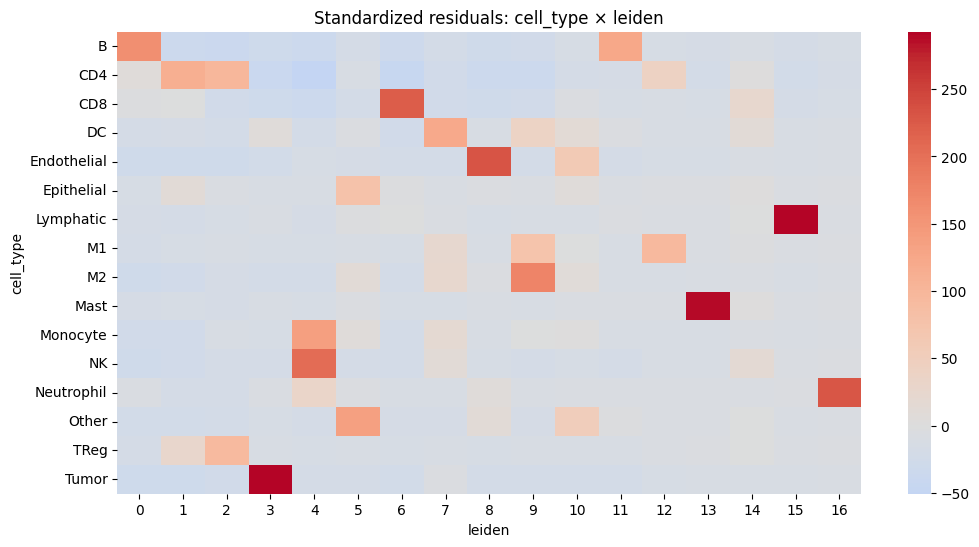

In [24]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import chi2_contingency

for _cluster_key in ["kronos", "leiden"]:
    df = sdata[f"{table_name}_normalized"].obs

    df = df[~df["cell_type_id"].isna()]

    contingency = pd.crosstab(df["cell_type"], df[_cluster_key])

    # chi squared test
    chi2, p, dof, expected = chi2_contingency(contingency)

    # cramers v
    def _cramers_v(confusion_matrix):
        chi2 = chi2_contingency(confusion_matrix)[0]
        n = confusion_matrix.sum().sum()
        phi2 = chi2 / n
        r, k = confusion_matrix.shape
        return np.sqrt(phi2 / min(k - 1, r - 1))

    print("Cramers v:", _cramers_v(contingency))

    print("Chi-squared statistic:", chi2)
    print("p-value:", p)

    plt.figure(figsize=(12, 6))
    sns.heatmap(contingency, cmap="viridis")
    plt.title(f"Cell type × {_cluster_key} association")
    plt.show()

    # Calculate standardized residuals
    residuals = (contingency - expected) / np.sqrt(expected)

    residuals_df = pd.DataFrame(residuals, index=contingency.index, columns=contingency.columns)

    resid_long = residuals_df.stack().reset_index()
    resid_long.columns = ["cell_type", _cluster_key, "std_residual"]

    # Sort by strength of deviation
    resid_long["abs_resid"] = resid_long["std_residual"].abs()
    top_effects = resid_long.sort_values("abs_resid", ascending=False).head(20)
    print(top_effects)

    plt.figure(figsize=(12, 6))
    sns.heatmap(residuals_df, center=0, cmap="coolwarm", annot=False)
    plt.title(f"Standardized residuals: cell_type × {_cluster_key}")
    plt.show()

Next, we spatially plot the KRONOS and Leiden clusters, and the cell types.

INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   


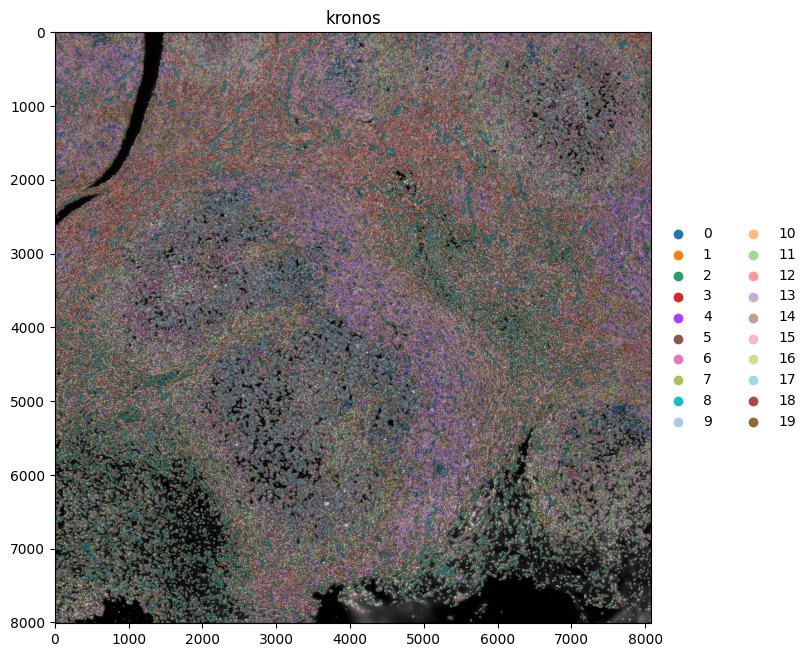

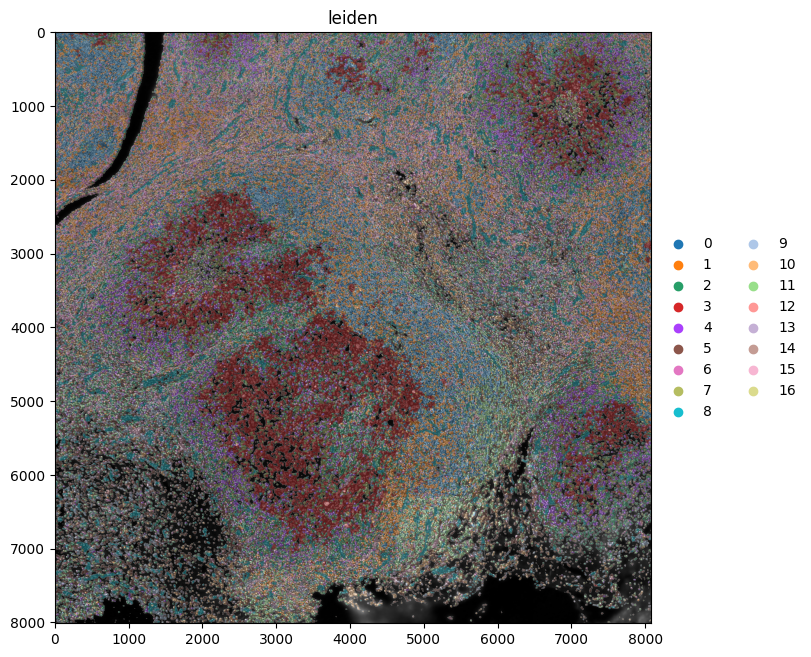

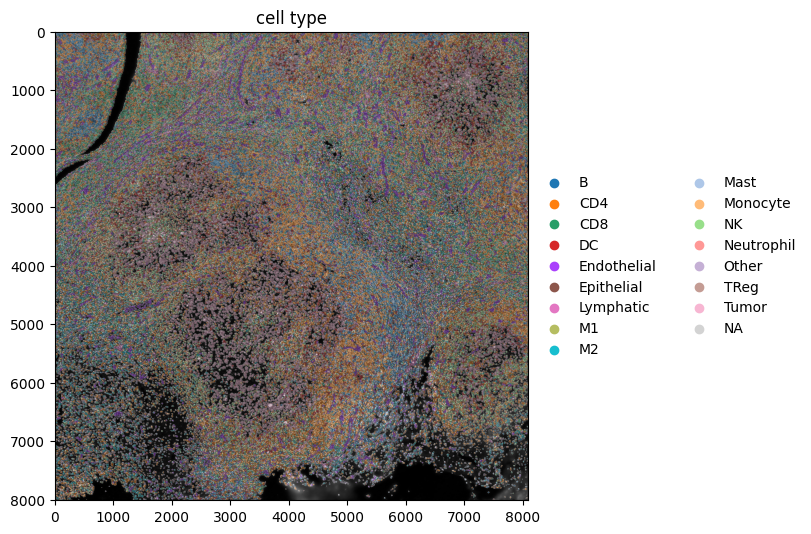

In [25]:
import dask.array as da
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize


c = "DAPI-01"

table_name = f"{table_name}_normalized"

se = hp.im.get_dataarray(sdata, element_name="image")
channels = se.c.data

c_id = np.where(channels == c)[0].item()
vmax = da.percentile(se.data[c_id].flatten(), q=99).compute()  # clip to 99% percentile
norm = Normalize(vmax=vmax, clip=True)

render_images_kwargs = {
    "cmap": "grey",
    "norm": norm,
    "scale": "scale3",
}
render_labels_kwargs = {
    "scale": "scale2",
    "fill_alpha": 0.2,
    "outline_alpha": 0.3,
}

show_kwargs = {"title": "kronos", "colorbar": False, "dpi": 100, "figsize": (8, 8)}
ax = hp.pl.plot_sdata(
    sdata,
    ax=None,
    image_name="image",
    channel=c,
    labels_name="segmentation_mask",
    table_name=table_name,
    color="kronos",
    render_images_kwargs=render_images_kwargs,
    render_labels_kwargs=render_labels_kwargs,
    show_kwargs=show_kwargs,
)

show_kwargs = {"title": "leiden", "colorbar": False, "dpi": 100, "figsize": (8, 8)}
ax = hp.pl.plot_sdata(
    sdata,
    ax=None,
    image_name="image",
    channel=c,
    labels_name="segmentation_mask",
    table_name=table_name,
    color="leiden",
    render_images_kwargs=render_images_kwargs,
    render_labels_kwargs=render_labels_kwargs,
    show_kwargs=show_kwargs,
)

show_kwargs = {"title": "cell type", "colorbar": False, "dpi": 100, "figsize": (8, 8)}
ax = hp.pl.plot_sdata(
    sdata,
    ax=None,
    image_name="image",
    channel=c,
    labels_name="segmentation_mask",
    table_name=table_name,
    color="cell_type",
    render_images_kwargs=render_images_kwargs,
    render_labels_kwargs=render_labels_kwargs,
    show_kwargs=show_kwargs,
)

The tiling effects in the `leiden` clusters are caused by the tiling effects visible in some of the channels. By removing the channels "EGFR", "FOXP3", "PD-L1", "T-BET", "TCR-G-D", "CD56" and "CD69", a lot of the tiling effects were removed when spatially plotting the leiden clusters.

Note that when  plotting the `kronos` clusters spatially, such tiling effects are not observed.

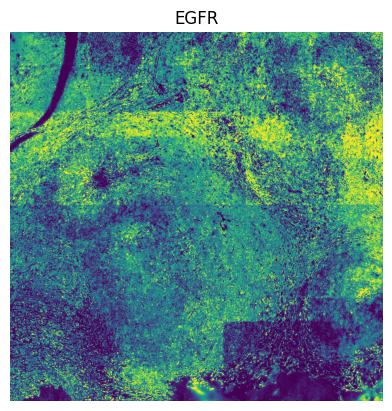

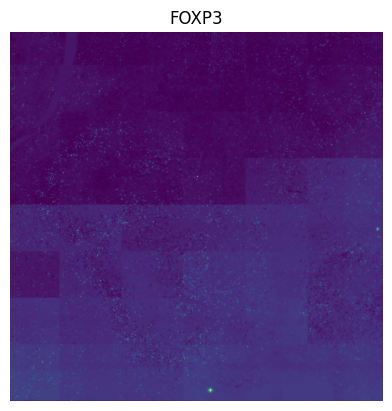

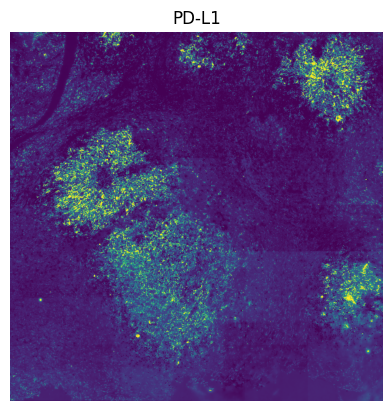

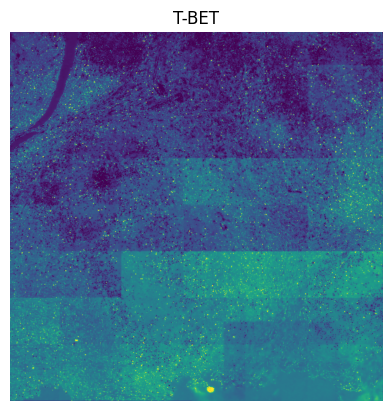

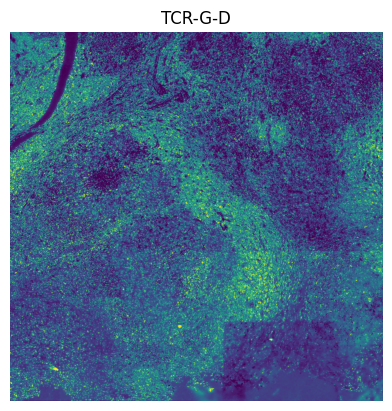

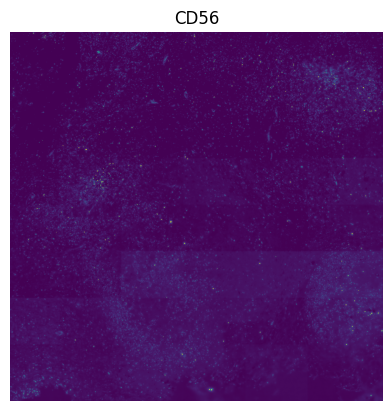

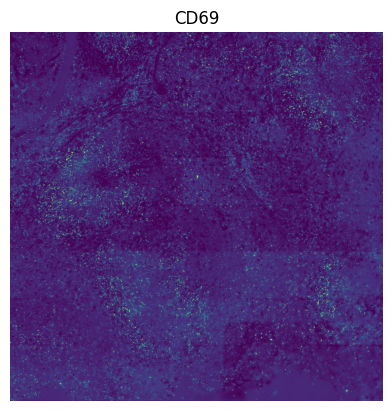

In [26]:
norm = Normalize(vmin=0, vmax=10000, clip=True)

render_images_kwargs = {
    "cmap": "viridis",
    "norm": norm,
    "scale": "scale3",
}

for channel in [
    "EGFR",
    "FOXP3",
    "PD-L1",
    "T-BET",
    "TCR-G-D",
    "CD56",
    "CD69",
]:  # these channels causing tiling artefact in leiden clustering.
    show_kwargs = {"title": str(channel), "colorbar": False, "dpi": 100, "figsize": (4, 4)}

    ax = hp.pl.plot_sdata(
        sdata,
        ax=None,
        image_name="image",
        channel=channel,
        render_images_kwargs=render_images_kwargs,
        show_kwargs=show_kwargs,
    )
    ax.axis("off")